<a href="https://colab.research.google.com/github/danielarugeles1972-prog/Parte-pr-ctica-estad-stica-descriptiva/blob/main/PARCIAL_2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import io
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as pl
from scipy.stats import shapiro
import plotly.express as px
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, kendalltau

# Estadistica descriptiva para variables cuantitativas



*   Gráficos estadiscos para datos univariados o para una sola variable cuantitativa
*   Determinar las medidas descriptivas para datos univariados cuantitativos



In [ ]:
from google.colab import files # Para cargar archivos en google colab
uploaded = files.upload()


Saving nac2022.csv to nac2022 (3).csv


In [ ]:
io_csv = io.BytesIO(uploaded['nac2022 (3).csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)

/tmp/ipython-input-3848346560.py:2: DtypeWarning:

Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.



,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
8,638,1,1,NaN,1,4,4,2022,12,1,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
11,1,1,1,NaN,1,6,5,2022,12,1,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
27,1,1,1,NaN,2,6,5,2022,12,1,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1


In [ ]:
df = tabla[["EDAD_PADRE", "N_EMB"]]
df.head(3)

,EDAD_PADRE,N_EMB
COD_DPTO,,
8,29,2
11,24,2
27,25,4


In [ ]:
df1 =df[(df.EDAD_PADRE < 120) &  (df.N_EMB != 99)]
df1.head(5)

,EDAD_PADRE,N_EMB
COD_DPTO,,
8,29,2
11,24,2
27,25,4
8,29,4
76,21,1


/tmp/ipython-input-2208588123.py:9: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.



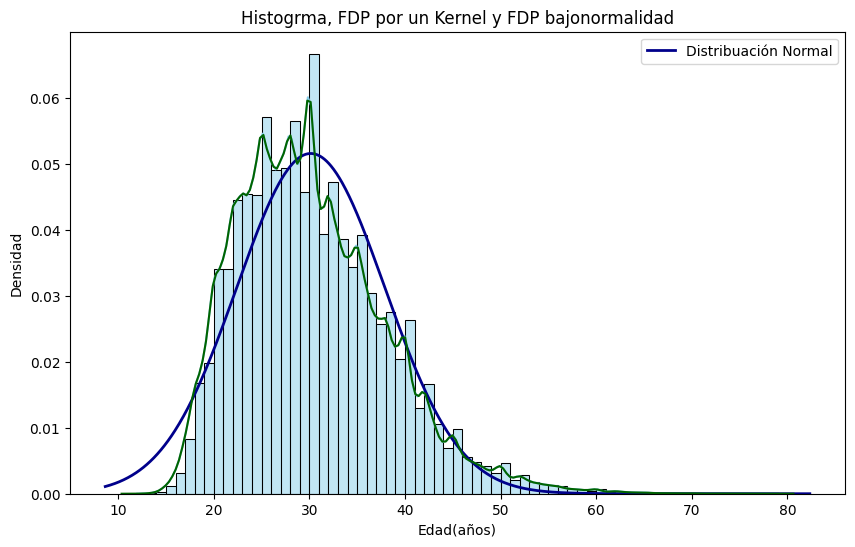

In [ ]:
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.EDAD_PADRE, bins = intervalos1, kde = True, stat = "density", color = "skyblue", edgecolor = "black") #kde = True es la gráfica de densidad de probabilidad estimada por el método de Kernell

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribuación Normal', color = 'darkblue')
sns.kdeplot(x=df1.EDAD_PADRE, color= "darkgreen")
plt.title('Histogrma, FDP por un Kernel y FDP bajonormalidad')
plt.xlabel('Edad(años)')
plt.ylabel('Densidad')
plt.legend()

# Mostrar el gráfico
plt.show()

Sea $X$=Edad del padre de un recién nacido en Colombia.

Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método Kernel (línea cyan) no coincide con la función de densidad de probabilidad asumiendo el supuesto de normalidad (línea azul),
$\Rightarrow \text{Normal} (\text{Media} = \bar{x}, \text{Varianza} = S^2_x)$,
entonces no asumimos normalidad.


In [ ]:
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 568276.



ShapiroResult(statistic=np.float64(0.9627145872200148), pvalue=np.float64(1.9188334613237818e-116))

*  Si el **valor p** en una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%  
*  Si el **valor p** en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%

En nuestro caso particular, tenemos que pvalue=0.0 < 0.05, es decir, se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal

In [ ]:
df1.EDAD_PADRE.count()
len(df1.EDAD_PADRE)

568276

In [ ]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100)
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=np.float64(0.870198667401116), pvalue=np.float64(7.140768743108707e-08))

Como el valor de p (igual a $6.3868156173640814 \times 10^{-09}$) es menor que 0.05, entonces se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal



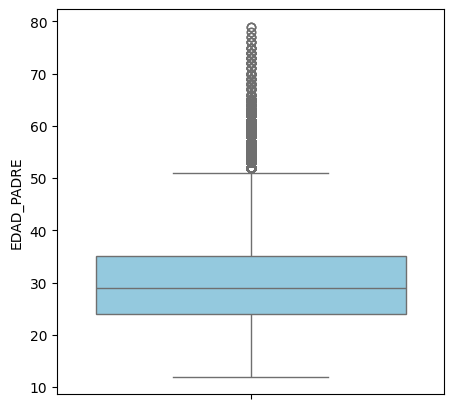

In [ ]:
plt.figure(figsize=(5, 5))
sns.boxplot(df1.EDAD_PADRE, color='skyblue', saturation=0.75)
plt.show()

Se considera que la edad de un padre de un recien nacido en Colombia es atipica si es mayor a 50 años. El primer cuartil es es aproximadamente en 25 años, la media aritmética es aproximadamente de 29 años y el tercer cuartil es aproximadamente de 35 años.
$\text{Rango intercuartílico = Tercer cuartil - Primercuartil} = 35 - 25 =10$

In [ ]:
plt.figure(figsize=(5, 5))
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recién nacido en Colombia.

In [ ]:
print(f"Media:{np.mean(df1.EDAD_PADRE)}")
print(f"Varianza:{np.var(df1.EDAD_PADRE)} y la desviacion estándar es de {np.std(df1.EDAD_PADRE)}")
print(f"Asimetría:{skew(df1.EDAD_PADRE)}")
print(f"Curtosis:{kurtosis(df1.EDAD_PADRE)}")

Media:30.14822726984775
Varianza:59.92647978124465 y la desviacion estándar es de 7.741219528035919
Asimetría:0.7932633846824577
Curtosis:0.8974404731370482


*   Aproximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 30.1 años.
*   Aproximadamente la distancia entre los valores de la edad de un padre de un recién nacido en Colombia y la media es de 7.74 años.
*   La dristribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria.
*   La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padre de un recién nacido en Colombia con respecto a la media.




* Diagrama de dispersión y la recta de regresión para datos bivariados.

Una variable depende de la otra, cuando la ejecución de esta se ve afectada por la variable independiente. *Ejemplo*: El precio de una vivienda depende del número de habitaciones, ya que entre más habitaciones se tiene mayor precio.

Una variable está correlacionada con otra, cuando guardan cierta relación, pero no es posible hablar de dependencia. *Ejemplo*: Consumo de arroz y de carne, ya que se ha visto que al comerse más arroz se come más carne, pero no hay una dependencia entre estas dos variables.





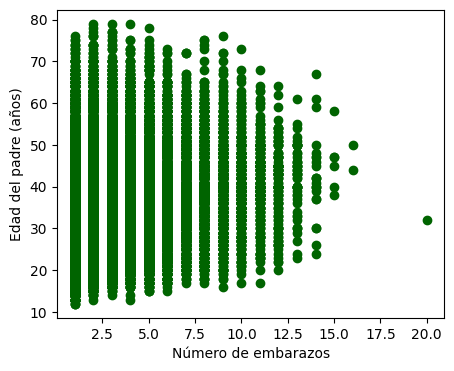

In [ ]:
plt.figure(figsize= (5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color= "darkgreen", marker="o")
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre (años)')
plt.show()

Se observa en el diagrama de dispresión una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no están correlacionadadas. Para nuestro ejemplo queiere decir que el número de embarazos y la edad de un padre en Colombia no están correlacionadas (La edad de un padre de un recién nacido en Colombia)

In [ ]:
modelo= LinearRegression()
#df1["N_EMB"] es igual a escribir df1.N_EMB
modelo.fit(np.array(df1.N_EMB).reshape(-1, 1), np.array(df1["EDAD_PADRE"]).reshape(-1, 1))
predi_lineal=modelo.predict(np.array(df1.N_EMB).reshape(-1, 1))
predi_lineal

array([[29.91360274],
       [29.91360274],
       [33.91580866],
       ...,
       [29.91360274],
       [31.9147057 ],
       [29.91360274]])

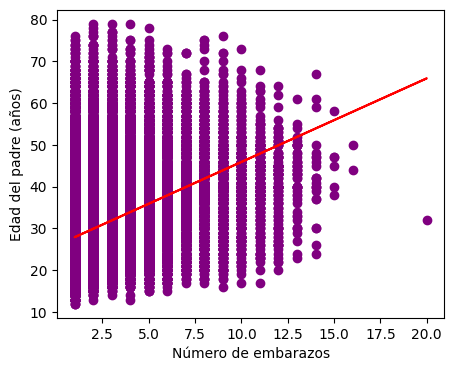

In [ ]:
plt.figure(figsize= (5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color= "purple", marker="o")
plt.plot(df1["N_EMB"], predi_lineal, linestyle='-', color="red")
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre (años)')
plt.show()

De acuerdo con la recta de regresión se determina una correlación positiva, es decir que entre más número de embarazos,mayor es la edad del padre de un recién nacido en Colombia.

*La variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y*

In [ ]:
coef_pearson = np.corrcoef(df1["N_EMB"], df1["EDAD_PADRE"])[0, 1]
coef_spearman, _ = spearmanr(df1["N_EMB"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_EMB"], df1["EDAD_PADRE"])
print(f"Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente {coef_pearson},{coef_spearman}, {coef_kendall}")

Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente 0.3439949710988243,0.3709076724499916, 0.28930213851230707


Para la interpretación de los coeficientes de correlación nos ayudaremos de la referencia:

Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174. [Link](https://www.jstor.org/stable/pdf/2529310.pdf)


*   X y Y son independientes o no están correlacionadas:  $\rho (X,Y) \approx 0, \eta (X,Y) \approx 0, \kappa (X,Y) \approx 0$
*   Y depende insignificante de X o X y Y están insignificativamente correlacionadas si $0 < \vert \rho (X,Y) \vert < 0.2$, $0 < \eta \rho (X,Y) \vert < 0.2$, $0 < \vert \kappa (X,Y) \vert < 0.2$
*    Y depende discretamente de X o X y Y están discretamente correlacionadas si $0.2 < \vert \rho (X,Y) \vert < 0.4$, $0.2 < \eta \rho (X,Y) \vert < 0.4$, $0.2 < \vert \kappa (X,Y) \vert < 0.4$
*    Y depende moderadamente de X o X y Y están moderadamente correlacionadas si $0.4 < \vert \rho (X,Y) \vert < 0.6$, $0.4 < \eta \rho (X,Y) \vert < 0.6$, $0.4 < \vert \kappa (X,Y) \vert < 0.6$
*    Y depende sustancialmente de X o X y Y están sustancialmente correlacionadas si $0.6 < \vert \rho (X,Y) \vert < 0.8$, $0.6 < \eta \rho (X,Y) \vert < 0.8$, $0.6 < \vert \kappa (X,Y) \vert < 0.8$
*    Y depende fuertemente de X o X y Y están fuertemente correlacionadas si $0.8 < \vert \rho (X,Y) \vert < 1$, $0.8 < \eta \rho (X,Y) \vert < 1$, $0.8 < \vert \kappa (X,Y) \vert < 1$





De acuerdo con los coeficientes de correlación de Pearson, Kendall y de Spearman se determina que el número de embarazos y la edad de un padre de un recién nacido en Colombia están discretamente correlacionadas.